Bicycle level of traffic stress: Network connectivity & accessibility analysis
======== 


Note: This is the code from the master thesis of Tim Fässler, submitted on the 30.09.2023 at the University of Zurich. 

Phase 1: Data Pre-Processing
----

### Importing packages / libraries / modules

In [ ]:
# %%capture

# Importing all the used packages/libraries/modules
import pandas as pd
import geopandas as gpd
import shapely as sh
import matplotlib.pyplot as plt
import momepy
import networkx as nx
import contextily as cx
import folium
import numpy as np
from tqdm.auto import tqdm, trange
from statistics import median
import random as rd
import sys
import osmnx as ox
from scipy import spatial 
import os

# Some custom functions + 1 function from a forum
from thesis_functions import *

### Reading files / Pre-processing

In [ ]:
# Setting directory for input and output files
os.chdir("--your-path--")

# Reading main road network data that needs to be aggregated/simplified.
bikeable = gpd.read_file("bikeable_velonetz.shp")
tlm = gpd.read_file("tlm.shp")

# Choosing relevant attributes
bikeable = bikeable[['velostreif','veloweg', 'einbahn', 'vmax', 'geometry', 'one_way', 'near_tram', 'ped_island', 'velonetz']]
tlm = tlm[['OBJEKTART', 'geometry']]

# Turn them into networkx graphs to simplify the two networks, for now they are undirected.
g_bikeable = momepy.gdf_to_nx(bikeable, approach="primal", directed=True) 
g_bikeable = nx.Graph(g_bikeable)
g_tlm = momepy.gdf_to_nx(tlm, approach="primal", directed=True) 
g_tlm = nx.Graph(g_tlm)

# A quick look at the base network, a few attributes were already added to it in QGIS beforehand due to practicabiltiy reasons.
bikeable.head(3)

,velostreif,veloweg,einbahn,vmax,geometry,one_way,near_tram,ped_island,velonetz
0,0,0,TF,50.0,"LINESTRING (2681136.202 1246008.445, 2681126.5...",0,0,0,Basisnetz
1,FT,0,0,30.0,"LINESTRING (2683484.172 1248265.833, 2683474.8...",0,1,0,Basisnetz
2,0,0,0,30.0,"LINESTRING (2683275.421 1251403.097, 2683261.7...",0,0,0,Vorzugsrou


### Simplifiying / Aggregating geometries of road data

In [3]:
# Simplify/Aggregate the main road network, attributes of aggregated section are all chosen on the weakest link principle. Depending on the attribute a short helper function was made.
bikeable_simplified = simplify_graph(nx.MultiDiGraph(g_bikeable),
                              aggregation = {'geometry': sh.ops.linemerge,
                                             'velostreif': agg_velostreif,
                                             'veloweg': min,
                                             'einbahn': agg_einbahn,
                                             'vmax': np.max,
                                             'mm_len': sum,
                                             'one_way': agg_one_way,
                                             'near_tram': max,
                                             'ped_island': max,
                                             'velonetz': agg_velonetz})

# Converting the simplified graph to a geodataframe
bikeable_simplified = nx.Graph(bikeable_simplified)
nodes_bikeable_simplified, bikeable_simplified_gdf = momepy.nx_to_gdf(bikeable_simplified, points= True, lines = True)
print(f"Returned into unidirectional network for now: {len(bikeable_simplified_gdf)} edges")
bikeable_simplified_gdf = bikeable_simplified_gdf.reset_index().set_crs('2056')

# To explore the new edges and network nodes outside of python:
# nodes_bikeable_simplified.to_file('nodes_bikeable_simplified.gpkg')
# bikeable_simplified_gdf.to_file('bikeable_simplified_gdf.gpkg')

Begin topologically simplifying the graph...
Identified 5940 edge endpoints
Simplified graph: 10000 to 5940 nodes, 25464 to 17344 edges
Returned into unidirectional network for now: 8618 edges


In [4]:
# Same thing with the second essential road network data
tlm_simplified = simplify_graph(nx.MultiDiGraph(g_tlm),
                              aggregation = {'geometry': sh.ops.linemerge,
                                             'OBJEKTART': agg_objektart,
                                             'BEFAHRBARK': agg_befahrbark,
                                             'VERKEHRSBE': agg_verkehrsbe,
                                             'mm_len': sum})

tlm_simplified = nx.Graph(tlm_simplified)
nodes_tlm_simplified, tlm_simplified_gdf = momepy.nx_to_gdf(tlm_simplified, points= True, lines = True)
print(f"Returned into unidirectional network for now: {len(tlm_simplified_gdf)} edges")
# Some preparation for further use
tlm_simplified_gdf = tlm_simplified_gdf[['OBJEKTART', 'geometry']]
tlm_simplified_gdf = tlm_simplified_gdf.reset_index().set_crs('2056')

# To explore the new edges and network nodes outside of python:
# nodes_tlm_simplified.to_file('nodes_tlm_simplified.gpkg')
# tlm_simplified_gdf.to_file('simplified_edges_tlm.gpkg')

Begin topologically simplifying the graph...
Identified 16540 edge endpoints
Simplified graph: 21860 to 16540 nodes, 59238 to 48598 edges
Returned into unidirectional network for now: 24190 edges


### Matching of road data sets

In [5]:
# Adding Slope

# After simplifying the segments of the bikeable network, we can add the slope to the data
# QGIS was used for easily interpolating points along the new geometries and drape them with a digital elevation model
inter_points = gpd.read_file('interpolated_points_3.shp')

# This function calculates the median slope of all slopes between the interpolated points per road segment.
# Inputs: get_median_slope(interpolated_points (gedataframe), point_spacing (m))
# 3 Meters because the points were interpolated all 3 meters along the road segments
median_slope_dict = get_median_slope(inter_points, 3)

# Join the median slopes to the main road network 
slope_df = pd.DataFrame.from_dict(median_slope_dict, orient='index', columns = ['median_slope'])
slope_df.reset_index(inplace = True)
slope_added = bikeable_simplified_gdf.merge(slope_df, on = 'index', how = 'left')

# All segments that are under 30 meters are deemed irelevant/insignificant as firstly short steep trips are fine for cyclists and secondly the median is more prone to outliers.
slope_added.loc[slope_added['geometry'].length < 30, 'median_slope'] = 0

# To explore outside of Python:
# slope_added.to_file("slope_added.gpkg")

In [6]:
# This function matches two road layers based on proximity. The bicycle level of traffic stress network is based on the weakest link principle, therefore this matching is relatively simple and just a little more advanced than centroid matching.
# Inputs: road_match(l1 (gdf), l2 (gdf), Buffer (m))
# Output: Matched gdf with the geometries of the first input.
matched_1 = road_match(slope_added, tlm_simplified_gdf, 10)

# A quick look at the matched new gdf:
matched_1.head(3)

# To explore the matched roads:
# matched_1.to_file('matched_1.gpkg')

8458 out of 8618 edges could be matched with a buffer size of 10 meters (160 unmatched edges)


,velostreif,veloweg,einbahn,vmax,geometry,one_way,near_tram,ped_island,velonetz,mm_len,node_start,node_end,median_slope,OBJEKTART
index,,,,,,,,,,,,,,
0,0,0,TF,NaN,"LINESTRING (2681136.202 1246008.445, 2681126.5...",0,0,0,Basisnetz,170.112030,0,4895,6.870333,2m Weg
1,0,0,0,30.0,"LINESTRING (2681143.657 1246013.151, 2681139.9...",1 FT,0,0,Basisnetz,8.828144,0,4685,0.000000,4m Strasse
2,0,0,0,NaN,"LINESTRING (2681262.459 1246070.846, 2681260.4...",0,0,0,Basisnetz,258.681049,0,4684,3.292333,4m Strasse


In [7]:
# Reading car parking data, which is only car parkings that lay directly on the road and therefore narrow the road.
parking = gpd.read_file("car_parkings.shp")
# Removing unnessecary attributes
parking = gpd.GeoDataFrame(parking['geometry'])

# This functions indicates and attributes the road segments wherever parking spots are placed on the road.
# Inputs: parking_match(roads (gdf), parkings (gdf))
matched_2 = parking_match(matched_1, parking)

# To explore the data outside of Python:
# matched_parkings.to_file('parking_match.gpkg')

In [8]:
# Reading daily traffic volume data
dtv = gpd.read_file("dtv_2018.shp")
# Cleaning up the data
dtv = dtv[['DWV_ANZ_Q', 'geometry']]
dtv.reset_index(inplace = True)
dtv.set_crs('2056', inplace = True)

# And again matching with the function road_match
# Note: In Comparison to the first road match here a lot of these edges will not be matched because not all roads have daily traffic volume data and therefore are not in the dtv data set
matched_3 = road_match(matched_2, dtv, 10)

# To explore the data outside of Python:
# matched_dtv.to_file('matched_dtv_10m.gpkg')

4663 out of 8618 edges could be matched with a buffer size of 10 meters (3955 unmatched edges)


Phase 2: Bicycle level of traffic stress (LTS) classification
----

### Preparing for classification

In [9]:
# Checking the discrete variables for problematic/unclear values and for wrong data type.
no_grps = ['geometry', 'n_parkings', 'DWV_ANZ_Q', 'mm_len', 'node_start', 'node_end', 'median_slope']
print('Discrete variables:')
for i in matched_3:
    if i not in no_grps:
        print(f'    - Variable {i} ({matched_3[i].dtype}) has the following unique options {matched_3[i].unique()}')
print('Continous variables types:')
print(f'    - Variable DWV_ANZ_Q: {matched_3["DWV_ANZ_Q"].dtype}')
print(f'    - Variable median_slope: {matched_3["median_slope"].dtype}')

Discrete variables:
    - Variable velostreif (object) has the following unique options ['0' 'FT' 'TF' '1' 'BOTH' None]
    - Variable veloweg (int64) has the following unique options [0 1]
    - Variable einbahn (object) has the following unique options ['TF' '0' 'FT' None]
    - Variable vmax (float64) has the following unique options [nan 30. 50. 20. 60.]
    - Variable one_way (object) has the following unique options ['0' '1 FT' '1 TF']
    - Variable near_tram (int64) has the following unique options [0 1]
    - Variable ped_island (int64) has the following unique options [0 1]
    - Variable velonetz (object) has the following unique options ['Basisnetz' '0' 'Vorzugsrou' None 'Hauptnetz' 'Ambiguous']
    - Variable OBJEKTART (object) has the following unique options ['2m Weg' '4m Strasse' '6m Strasse' '10m Strasse' '3m Strasse'
 '8m Strasse' '1m Weg' 'Platz' nan 'Verbindung']
Continous variables types:
    - Variable DWV_ANZ_Q: float64
    - Variable median_slope: float64


In [10]:
# This is a function that specifically cleans up the problems of the this dataset. The decisions are all made based on the weakest link principle and are described in the methodology of the thesis.
cleaned = clean_variables(matched_3)

The ambiguous discrete variable values were cleaned up.
There are no more Null/None values in the dataframe.


### Conversion to a bidirectional road network

In [11]:
# This is a function that transforms the until now onedirectional road network into a bidirectional one. A variable of the input geodataframe defines if the road is a one-way road or can be accessed from both sides. Geometries and other directional variables are reversed when needed. 
# Inputs: transform_bidirectional(road network (gdf), directional variable (string))
# Output: Bidirectional road network (gdf)
roads_bidirectional = transform_bidirectional(cleaned, 'einbahn')

# To explore outside of python:
# roads_bidirectional.to_file('bidirectional.shp')

einbahn
0     7541
FT     569
TF     508
Name: einbahn, dtype: int64


Reversing geometries & directional variables: 100%|██████████| 8049/8049 [00:02<00:00, 3248.25it/s]


einbahn
FT    16159
Name: einbahn, dtype: int64


### Level of traffic stress classification

In [12]:
classification_tables = {
    'A 1': 1, 
    'A 2.1': 2,     'A 2.2': 2,     'A 2.3': 3,
    'A 3.1': 2,     'A 3.2': 2,     'A 3.3': 3,
    'A 4.1': 2,     'A 4.2': 2,     'A 4.3': 2,
    'A 5.1': 3,     'A 5.2': 3,     'A 5.3': 3,
    'A 6.1': 3,     'A 6.2': 3,     'A 6.3': 3,
    'A 7.1': 3,     'A 7.2': 3,     'A 7.3': 3,
    'A 8.1': 3,     'A 8.2': 3,     'A 8.3': 3,

    'B 1': 1, 
    'B 2.1': [1,2], 'B 2.2': 2,     'B 2.3': 2,     'B 2.4': [2,3], 'B 2.5': 3,     'B 2.6': 3,     'B 2.7': 3,
    'B 3.1': [1,2], 'B 3.2': 2,     'B 3.3': 3,     'B 3.4': [2,3], 'B 3.5': 3,     'B 3.6': 3,     'B 3.7': 3,
    'B 4.1': [1,2], 'B 4.2': 2,     'B 4.3': 3,     'B 4.4': [2,3], 'B 4.5': 3,     'B 4.6': 3,     'B 4.7': 3,
    'B 5.1': 3,     'B 5.2': 3,     'B 5.3': [4,3], 'B 5.4': 3,     'B 5.5': 3,     'B 5.6': 4,     'B 5.7': 4,
    'B 6.1': 3,     'B 6.2': 3,     'B 6.3': [4,3], 'B 6.4': 3,     'B 6.5': 3,     'B 6.6': 4,     'B 6.7': 4,
    'B 7.1': 3,     'B 7.2': 4,     'B 7.3': 3,     'B 7.4': 4,     'B 7.5': 4,
    'B 8.1': 3,     'B 8.2': 4,     'B 8.3': 3,     'B 8.4': 4,     'B 8.5': 4      
}

In [13]:
# This function classifies all road segments according to the classification table that is given as an input dictionary. It takes a few additional optional inputs to slightly change the classification, see ???.
# Inputs: lts_classification(road_network(gdf), classification_tables(dictionary), ADT_significance('High'/'Low'), slope_inclusion(True/False), planned_network(True/False), planned_network_classification(dictionary)
# Output: classified road network, occurence dataframe
classified_network, occurence_df = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = True)

# To explore the classified network:
classified_network.to_file("classified_network.gpkg")
occurence_df.to_csv("occurence_df.csv")

Classifying road segments:   0%|          | 0/16159 [00:00<?, ?it/s]

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 10575.75it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 6197, p = 38.35%
    LTS 2: n = 3693, p = 22.85%
    LTS 3: n = 3526, p = 21.82%
    LTS 4: n = 2743, p = 16.98%


In [14]:
# Convert the geodataframe back into a bidirectional network in the NetworkX format
Ground_Network = momepy.gdf_to_nx(classified_network, approach="primal", multigraph = False, directed=True) 

# For further calculations the length of each edge is calculated and appended as a new attribute
edge_lengths = {}
for s, e, a in Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(Ground_Network, edge_lengths, 'edge_length')

In [15]:
# This function splits the road network into 4 networks, for each Level of traffic stress group their own. The roads with higher LTS are not deleted but weighted (LTS + 1 -> weight of 1000, LTS + 2 -> 2000, etc.). The weighting is done like this, so that in the upcoming calculations, shortest path cutoff of 999 can be set for a hard LTS barrier and a cutoff of 1999 or even 2999 can be set for a soft LTS barrier.
# Input: split_weigh_network(network(NetworkX network))
# Output: 4 NetworkX networks
Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4 = split_weigh_network(Ground_Network)

Phase 3: Connectivity & Accessibility measures
----

### Connectivity measure

In [17]:
# This function calculates a measure of connectivity of the given network. It does so by generating trips in a certain distance range and checking if they are firstly connected at all with the given LTS network and secondly if the paths dont have an excessive amount of detour compared to the optimal shortest path. 
# Inputs: connectivity_measure(network(nx-network), n_iterations(int), distance(int), lts_barrier = 'soft' ('hard'/'soft'), output = True(bool))
# Output: result row(gdf) consiting of: n trips, n trips connected, n trips unconnected due to LTS, n trips unconnected due to detour, % connected trips, avg trip length
x = connectivity_measure(Network_LTS_2, n_iterations = 200, distance = 1000, lts_barrier = 'soft')
x


Generating paths and calculating connectivity: 100%|██████████| 200/200 [00:01<00:00, 195.50it/s]

From the 200 iterations, 10 times there was no path at all between start and end node.
Of the remaining 190 paths:
    - 57 trips were possible with the respective LTS level tolerance.
    - 111 trips were not connected due to the connecting roads LTS being to high.
    - 22 trips were deemed "unconnected" due to the involved excessive detour.
Resulting in a connectivity of 30.0% of 200 trips randomly generated in a radius of 1000 meters.


,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_connectivity,avg_distance
0,190.0,57.0,111.0,22.0,30.0,626.54


### Stability of connectivity measure / network model (Monte-Carlo)

Monte Carlo Approximation of average values:   0%|          | 0/500 [00:00<?, ?it/s]

Monte Carlo Approximation of average values: 100%|██████████| 500/500 [28:10<00:00,  3.38s/it]


,avg_p_connected,avg_p_unconnected_lts,avg_p_unconnected_detour,avg_distance
0,13.64 ±3.06,80.19 ±3.7,6.18 ±2.22,1284.95 ±43.17


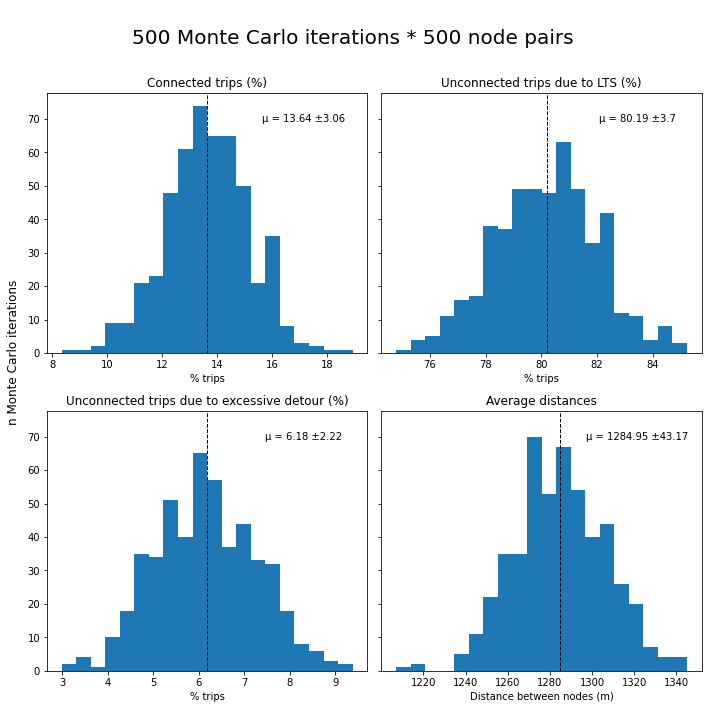

In [25]:
# This function tests the stability of the connectivity measure by iteratively running it and checking if the different results follow normal distribution. 
# Inputs: monte_carlo_connectivity(network(nx network), loops(of monte carlo, n), distance(m), n_iterations(n), lts_barrier = 'hard'('hard'/'soft')
# Output: result row (gdf) consisting of: avg % connected, avg % unconnected LTS, avg % unconnected detour, avg % percentage connected
monte_carlo_connectivity(Network_LTS_2, loops = 500, distance = 2000, n_iterations = 500)

Monte Carlo Approximation of average values: 100%|██████████| 50/50 [1:22:50<00:00, 99.41s/it] 


,avg_p_connected,avg_p_unconnected_lts,avg_p_unconnected_detour,avg_distance
0,13.65 ±0.7,80.07 ±0.87,6.28 ±0.54,1284.95 ±9.79


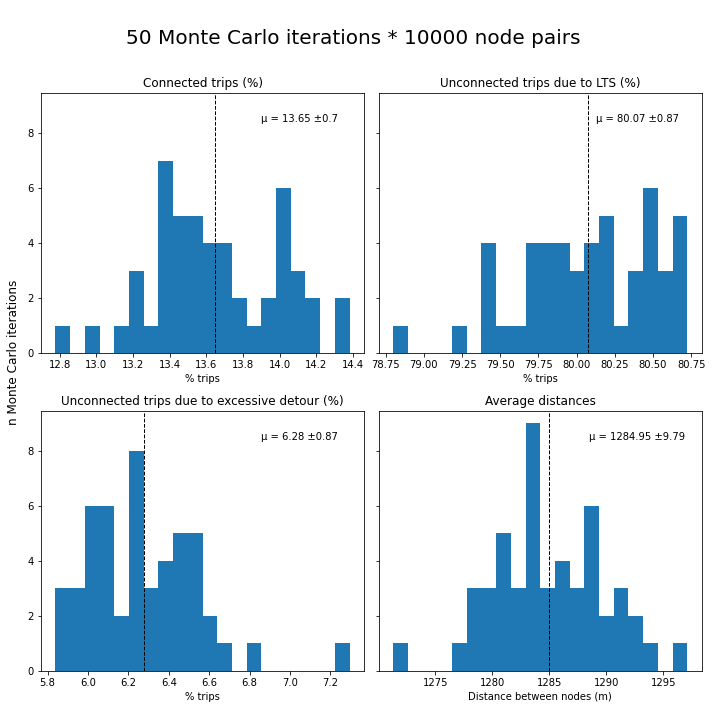

In [34]:
monte_carlo_connectivity(Network_LTS_2, loops = 50, distance = 2000, n_iterations = 10000)

Monte Carlo Approximation of average values: 100%|██████████| 100/100 [59:05<00:00, 35.46s/it]


,avg_p_connected,avg_p_unconnected_lts,avg_p_unconnected_detour,avg_distance
0,14.6 ±0.95,77.72 ±1.11,7.68 ±0.69,1283.46 ±14.22


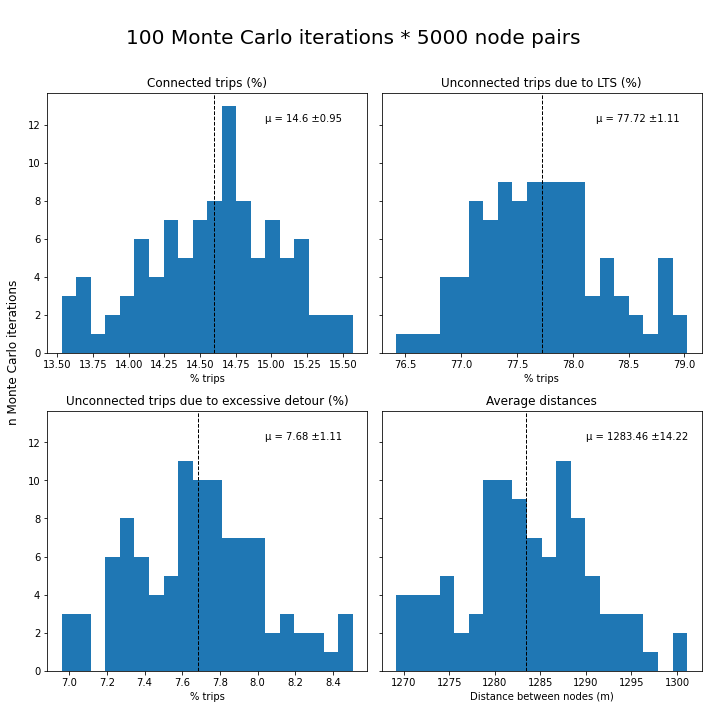

In [ ]:
# Once with a lot of node pairs to evaluate the uncertainty of the resulting percentages
monte_carlo_connectivity(Network_LTS_2, loops = 100, distance = 2000, n_iterations = 5000)

### Data preparation for accessibility measure

In [18]:
# Importing the points of interest of the accessibility measure
poi = gpd.read_file('poi_zuerich.shp')
poi = poi[['fid', 'fclass', 'type', 'geometry']]
# Finding the closest node from them to be able to use them in shortest path algorithms 
poi['closest_node'] = [closest_node(Network_LTS_1, (i.x, i.y)) for i in poi['geometry']]
# Taking a look at the poi's
print(poi.groupby(['type'])['type'].count())

# Importing the neighbourhood/district data
neighbourhoods = gpd.read_file('neighbourhoods.shp')
neighbourhoods = neighbourhoods[['qname', 'kname', 'geometry']]

# Importing the starting points of the accessibility measure, in this case all houses from Zurich
houses = gpd.read_file('houses_zuerich.shp')
houses = houses[['geometry', 'PERS_N']]
# New gdf with the houses as points instead of polygons
house_points = houses.drop(columns = ['geometry']) 
house_points['geometry'] = houses.centroid
house_points = gpd.sjoin(gpd.GeoDataFrame(house_points), neighbourhoods, how = 'left', predicate = 'intersects')
# Adding the closest nodes as an attribute
# Would theoretically make more sense to do this step in the accessibility function to be able to input different networks, but takes ca. 90 sek to calculate so its placed here to make the accessibility function run faster. The networks nodes are the same anyway.
house_points['closest_node'] = [closest_node(Network_LTS_1, (i.x, i.y)) for i in house_points['geometry']]
house_points.head(3)

type
bank                                 83
educational facility                415
medical facility                    220
public transport infrastructure    1172
supermarket                         168
Name: type, dtype: int64


,PERS_N,geometry,index_right,qname,kname,closest_node
0,82.0,POINT (2679135.745 1248757.520),0,Altstetten,Kreis 9,"(2679138.5619, 1248716.67)"
1,82.0,POINT (2679096.340 1248769.727),0,Altstetten,Kreis 9,"(2679080.0674, 1248741.6573)"
2,24.0,POINT (2679129.223 1248875.258),0,Altstetten,Kreis 9,"(2679058.4411, 1248880.6688)"


### Accessibility measure

In [32]:
# This function is similar to the connectivity measure but instead of generating random trips from any nodes, it has specific starting points and specific ending points (poi's). The function can focus on a specific neighbourhood or district and can also focus on a type of poi if the goal is to answer a specific question. If the variable nearest_poi is True, the function takes the nearest poi from the start point instead of a random poi in the buffer of the start point, but takes longer to calculate.
# Inputs: accessibility_measure(network (nx network), start_points (gdf), poi (gdf), n_iterations (n), lts_barrier = 'hard' ('hard'/'soft'), poi_type = None (string), neighbourhood = None (string), district = None (string), nearest_poi = False (boolean), output = True (boolean))
# Output: result row (gdf) consiting of: description spatial, description poi, n trips, n trips connected, n trips unconnected due to LTS, n trips unconnected due to detour, % connected trips
accessibility_measure(Network_LTS_2, house_points, poi, n_iterations = 200, nearest_poi = True, lts_barrier = 'soft')

 Generating paths and calculating connectivity:   0%|          | 0/200 [00:00<?, ?it/s]

 Generating paths and calculating connectivity: 100%|██████████| 200/200 [00:13<00:00, 14.97it/s]

From the 200 iterations, 10 times there was no path at all between start and end point.
Of the remaining 190 paths:
    - 14 times, the public service was accessible with the respective LTS level tolerance.
    - 163 times, the public service was not accessible due to the connecting streets LTS being to high.
    - 13 times, the public service were deemed not accessible due to the involved excessive detour.
Resulting in a accessibility of 7.37% of trips randomly generated to public services in a typical average bicycle trip length of 3 km.


,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility
0,NaN,NaN,190.0,14.0,163.0,13.0,7.37


In [34]:
# An example for a more specific question, accessibility to public transport infrastructure in the district Kreis 4 with a soft lts barrier
accessibility_measure(Network_LTS_3, house_points, poi, distance = 3000, district = 'Kreis 4', lts_barrier = 'soft', nearest_poi = True, n_iterations = 200, poi_type = "public transport infrastructure")

district Generating paths and calculating connectivity:   0%|          | 0/200 [00:00<?, ?it/s]

district Generating paths and calculating connectivity: 100%|██████████| 200/200 [00:10<00:00, 19.55it/s]

For the district Kreis 4:
From the 200 iterations, 8 times there was no path at all between start and end point.
Of the remaining 192 paths:
    - 52 times, a public transport infrastructure was accessible with the respective LTS level tolerance.
    - 20 times, a public transport infrastructure was not accessible due to the connecting roads LTS being to high.
    - 120 times, a public transport infrastructure were deemed not accessible due to the involved excessive detour.
Resulting in a accessibility of 27.08% of trips randomly generated to a public transport infrastructure in a distance of up to 3000 meters.


,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,n_no_target
0,Kreis 4,public transport infrastructure,192,52,20,120,27.08,0


Phase 4 Results & Explorations
---

Note: This section includes many different results that were included and summarized in the writing part of this thesis and will therefore not be explained extensively in this part.

### Connectivity comparison baseline input

In [43]:
# Connectivity comparison
c_iter = 10000
c_dist = 3000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,3.88,94.58,1.54
1,LTS 2,13.69,76.30,10.01
2,LTS 3,46.34,4.78,48.89
3,LTS 4,100.00,0.00,0.00


In [44]:
# Connectivity comparison
c_iter = 10000
c_dist = 2000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,6.76,90.94,2.29
1,LTS 2,18.58,68.56,12.86
2,LTS 3,52.01,4.99,43.00
3,LTS 4,100.00,0.00,0.00


In [45]:
# Connectivity comparison
c_iter = 10000
c_dist = 1000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,14.50,82.34,3.15
1,LTS 2,30.81,58.00,11.19
2,LTS 3,65.16,4.60,30.23
3,LTS 4,100.00,0.00,0.00


In [46]:
c_iter = 10000
c_dist = 5000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,1.76,97.47,0.77
1,LTS 2,7.72,86.00,6.27
2,LTS 3,39.05,5.38,55.57
3,LTS 4,100.00,0.00,0.00


### Connectivity comparison ADT significance low

In [19]:
classified_adt, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'low', slope_inclusion = False)

# Same processing as above
A_Ground_Network = momepy.gdf_to_nx(classified_adt, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in A_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(A_Ground_Network, edge_lengths, 'edge_length')

A_Network_LTS_1, A_Network_LTS_2, A_Network_LTS_3, A_Network_LTS_4 = split_weigh_network(A_Ground_Network)

Classifying road segments:   0%|          | 0/16159 [00:00<?, ?it/s]

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 11039.89it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 4483, p = 27.74%
    LTS 2: n = 2880, p = 17.82%
    LTS 3: n = 6550, p = 40.53%
    LTS 4: n = 2246, p = 13.9%


In [20]:
# Connectivity comparison
c_iter = 10000
c_dist = 1000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(A_Network_LTS_1, A_Network_LTS_2, A_Network_LTS_3, A_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,10.05,87.64,2.31
1,LTS 2,21.37,74.19,4.44
2,LTS 3,72.92,2.32,24.76
3,LTS 4,100.00,0.00,0.00


In [21]:
# Connectivity comparison
c_iter = 10000
c_dist = 2000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(A_Network_LTS_1, A_Network_LTS_2, A_Network_LTS_3, A_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,5.24,92.82,1.94
1,LTS 2,11.64,83.62,4.74
2,LTS 3,64.08,2.38,33.54
3,LTS 4,100.00,0.00,0.00


In [22]:
# Connectivity comparison
c_iter = 10000
c_dist = 3000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(A_Network_LTS_1, A_Network_LTS_2, A_Network_LTS_3, A_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,3.40,95.46,1.14
1,LTS 2,7.84,88.01,4.15
2,LTS 3,59.81,2.38,37.81
3,LTS 4,100.00,0.00,0.00


In [23]:
c_iter = 10000
c_dist = 5000
c_barr = 'soft'

# Helper function to run the same connectivity measure for all LTS groups and join the results
con_overview = connectivity_overview(A_Network_LTS_1, A_Network_LTS_2, A_Network_LTS_3, A_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,1.41,97.99,0.60
1,LTS 2,3.62,94.20,2.18
2,LTS 3,53.91,2.11,43.98
3,LTS 4,100.00,0.00,0.00


### Accessibility comparison

In [58]:
# Accessibility comparison general
a_iter = 10000
a_distance = 3000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

# Same thing for the accessibility measure
acc_overview = accessibility_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, a_start, a_poi, a_iter, a_distance, a_barr, a_poi_type, a_nearest_poi)
acc_overview

 Generating paths and calculating connectivity:   0%|          | 0/10000 [00:00<?, ?it/s]

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,0.86,98.95,0.19
1,LTS 2,6.33,87.48,6.18
2,LTS 3,35.79,8.34,55.87
3,LTS 4,100.00,0.00,0.00


In [59]:
# Accessibility comparison general
a_iter = 10000
a_distance = 1000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

# Same thing for the accessibility measure
acc_overview = accessibility_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, a_start, a_poi, a_iter, a_distance, a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,3.66,95.37,0.92
1,LTS 2,18.78,71.94,9.17
2,LTS 3,56.87,7.55,35.55
3,LTS 4,99.95,0.00,0.00


In [60]:
# Accessibility comparison general
a_iter = 10000
a_distance = 2000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

# Same thing for the accessibility measure
acc_overview = accessibility_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, a_start, a_poi, a_iter, a_distance, a_barr, a_poi_type, a_nearest_poi)
acc_overview

 Generating paths and calculating connectivity:   0%|          | 6/10000 [00:00<02:47, 59.56it/s]

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,1.60,98.02,0.38
1,LTS 2,9.26,82.51,8.23
2,LTS 3,41.58,8.08,50.33
3,LTS 4,100.00,0.00,0.00


In [61]:
# Accessibility comparison general
a_iter = 10000
a_distance = 5000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

# Same thing for the accessibility measure
acc_overview = accessibility_overview(Network_LTS_1, Network_LTS_2, Network_LTS_3, Network_LTS_4, a_start, a_poi, a_iter, a_distance, a_barr, a_poi_type, a_nearest_poi)
acc_overview

 Generating paths and calculating connectivity:   0%|          | 0/10000 [00:00<?, ?it/s]

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,0.35,99.51,0.14
1,LTS 2,3.12,93.98,2.91
2,LTS 3,31.24,8.74,60.03
3,LTS 4,100.00,0.00,0.00


### District Accessibility Analysis

In [62]:
# This function uses the accessibility measure with its inuts and calculates them in the same manner for all districts or all neighbourhoods, depending what you choose for the variable spatial level.
# Inputs: spatial_accessibility_analysis (network (nx network), spatial_level ('neighbourhood'/'district'), start_points (gdf), poi (gdf), n_iterations (n), lts_barrier = 'hard' ('hard'/'soft'), poi_type = None (string), nearest_poi = False (boolean))
# Output: gdf of all districts or neighbourhoods with their respective accessibility measure results row
spat_analysis = spatial_accessibility_analysis(Network_LTS_2, 'district', house_points, poi, n_iterations = 2000, distance = 1000, lts_barrier = 'soft', poi_type = 'supermarket', nearest_poi = False)
spat_analysis

# To visualise the results outside of python
# spat_analysis.to_csv('spat_analysis.csv')

Calculating accessibility for different districts: 100%|██████████| 12/12 [02:32<00:00, 12.74s/it]


,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
11,Kreis 12,supermarket,1922,755,763,404,39.28,0 (0.0%)
9,Kreis 2,supermarket,1986,552,986,447,27.79,1 (0.0005%)
1,Kreis 10,supermarket,1949,483,1354,98,24.78,14 (0.007%)
2,Kreis 5,supermarket,1916,449,1351,116,23.43,0 (0.0%)
0,Kreis 9,supermarket,1830,398,1248,130,21.75,54 (0.027%)
5,Kreis 11,supermarket,1927,389,1259,250,20.19,29 (0.0145%)
6,Kreis 6,supermarket,1934,234,1644,56,12.10,0 (0.0%)
8,Kreis 7,supermarket,1957,234,1535,83,11.96,105 (0.0525%)
3,Kreis 4,supermarket,1970,145,1810,15,7.36,0 (0.0%)
7,Kreis 8,supermarket,1954,123,1694,74,6.29,63 (0.0315%)


In [67]:
spat_analysis = spatial_accessibility_analysis(Network_LTS_2, 'district', house_points, poi, n_iterations = 2000, distance = 1000, lts_barrier = 'soft', poi_type = 'educational facility', nearest_poi = False)
spat_analysis

Calculating accessibility for different districts: 100%|██████████| 12/12 [02:49<00:00, 14.15s/it]


,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
11,Kreis 12,educational facility,1992,953,490,549,47.84,0 (0.0%)
9,Kreis 2,educational facility,1978,643,897,438,32.51,0 (0.0%)
1,Kreis 10,educational facility,1891,556,1260,75,29.40,0 (0.0%)
5,Kreis 11,educational facility,1970,573,1008,368,29.09,21 (0.0105%)
2,Kreis 5,educational facility,1928,423,1371,134,21.94,0 (0.0%)
0,Kreis 9,educational facility,1819,349,1160,261,19.19,49 (0.0245%)
6,Kreis 6,educational facility,1969,358,1497,113,18.18,1 (0.0005%)
8,Kreis 7,educational facility,1984,337,1455,138,16.99,54 (0.027%)
7,Kreis 8,educational facility,1974,330,1490,117,16.72,37 (0.0185%)
4,Kreis 3,educational facility,1899,178,1654,54,9.37,13 (0.0065%)


In [ ]:
spat_analysis = spatial_accessibility_analysis(Network_LTS_2, 'district', house_points, poi, n_iterations = 2000, distance = 1000, lts_barrier = 'soft', poi_type = 'public transport infrastructure', nearest_poi = False)
spat_analysis

In [70]:
spat_analysis = spatial_accessibility_analysis(Network_LTS_2, 'district', house_points, poi, n_iterations = 2000, distance = 1000, lts_barrier = 'soft', poi_type = 'bank', nearest_poi = False)
spat_analysis

,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
11,Kreis 12,bank,1999,966,133,229,48.32,671 (0.3355%)
9,Kreis 2,bank,1937,420,782,36,21.68,699 (0.3495%)
1,Kreis 10,bank,1938,220,1089,17,11.35,612 (0.306%)
0,Kreis 9,bank,1948,188,1193,25,9.65,542 (0.271%)
8,Kreis 7,bank,1913,124,1468,33,6.48,288 (0.144%)
4,Kreis 3,bank,1965,126,1522,24,6.41,293 (0.1465%)
10,Kreis 1,bank,1864,52,1812,0,2.79,0 (0.0%)
5,Kreis 11,bank,1999,50,708,0,2.50,1241 (0.6205%)
2,Kreis 5,bank,1985,27,1703,18,1.36,237 (0.1185%)
3,Kreis 4,bank,1965,22,1922,21,1.12,0 (0.0%)


In [71]:
spat_analysis = spatial_accessibility_analysis(Network_LTS_2, 'district', house_points, poi, n_iterations = 2000, distance = 1000, lts_barrier = 'soft', poi_type = 'medical facility', nearest_poi = False)
spat_analysis

,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
11,Kreis 12,medical facility,1993,993,632,368,49.82,0 (0.0%)
9,Kreis 2,medical facility,1963,542,1095,322,27.61,4 (0.002%)
1,Kreis 10,medical facility,1939,364,1199,132,18.77,244 (0.122%)
5,Kreis 11,medical facility,1939,324,1294,200,16.71,121 (0.0605%)
0,Kreis 9,medical facility,1952,260,1104,72,13.32,516 (0.258%)
8,Kreis 7,medical facility,1892,246,1402,87,13.00,157 (0.0785%)
2,Kreis 5,medical facility,1878,237,1536,105,12.62,0 (0.0%)
6,Kreis 6,medical facility,1926,198,1694,34,10.28,0 (0.0%)
4,Kreis 3,medical facility,1931,164,1737,19,8.49,11 (0.0055%)
3,Kreis 4,medical facility,1905,101,1791,13,5.30,0 (0.0%)


In [72]:
spat_analysis = spatial_accessibility_analysis(Network_LTS_2, 'district', house_points, poi, n_iterations = 5000, distance = 1000, lts_barrier = 'soft', nearest_poi = False)
spat_analysis

,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
11,Kreis 12,None,4888,2148,1585,1155,43.94,0 (0.0%)
9,Kreis 2,None,4871,1355,2622,894,27.82,0 (0.0%)
1,Kreis 10,None,4656,1106,3307,243,23.75,0 (0.0%)
5,Kreis 11,None,4821,1096,2958,767,22.73,0 (0.0%)
0,Kreis 9,None,4509,798,3204,497,17.70,10 (0.002%)
8,Kreis 7,None,4775,769,3650,347,16.10,9 (0.0018%)
2,Kreis 5,None,4821,754,3838,229,15.64,0 (0.0%)
6,Kreis 6,None,4833,591,4004,238,12.23,0 (0.0%)
7,Kreis 8,None,4685,509,3982,194,10.86,0 (0.0%)
4,Kreis 3,None,4682,471,4096,113,10.06,2 (0.0004%)


In [63]:
# This simple functions visualises the results of the spatial accessibility per neighbourhood or district
# This is the result of the input: spatial_accessibility_analysis(Network_LTS_3, 'district', house_points, poi, n_iterations = 500, lts_barrier = 'soft')
vis_spat_analysis(spat_analysis, neighbourhoods, classified_network)

### Planned network connectivity

In [76]:
# Comparison to an ideal planned network that prioritizes Vorzugsrouten and doesn't include the Basisnetz as essential to be LTS 1.
planned_network_classification = {
    'Vorzugsrouten': 1,
    'Basisnetz': None,
    'Hauptnetz': None
}
# Same processing as above
classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)

c_iter = 10000
c_dist = 1000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

Classifying road segments:   0%|          | 0/16159 [00:00<?, ?it/s]

Classifying road segments: 100%|██████████| 16159/16159 [00:02<00:00, 7153.62it/s] 


This classification results in the following LTS level distribution:
    LTS 1: n = 8499, p = 52.6%
    LTS 2: n = 2715, p = 16.8%
    LTS 3: n = 2648, p = 16.39%
    LTS 4: n = 2297, p = 14.21%


,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,26.70,61.22,12.08
1,LTS 2,44.53,27.82,27.65
2,LTS 3,74.48,3.06,22.46
3,LTS 4,100.00,0.00,0.00


In [77]:
c_iter = 10000
c_dist = 2000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,18.01,66.09,15.90
1,LTS 2,34.93,30.88,34.19
2,LTS 3,68.76,2.78,28.46
3,LTS 4,100.00,0.00,0.00


In [78]:
c_iter = 10000
c_dist = 3000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,13.83,70.06,16.11
1,LTS 2,30.70,31.25,38.05
2,LTS 3,67.11,2.68,30.20
3,LTS 4,100.00,0.00,0.00


In [79]:
c_iter = 10000
c_dist = 5000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,11.10,74.62,14.28
1,LTS 2,28.16,32.72,39.13
2,LTS 3,69.64,2.96,27.39
3,LTS 4,100.00,0.00,0.00


In [85]:
# Classification with an ideal planned network, Goals of the planned network can be defined here
planned_network_classification = {
    'Vorzugsrouten': 1,
    'Basisnetz': 1,
    'Hauptnetz': None
}

classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

# Same processing as above
P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)

# Connectivity of ideal planned network
c_iter = 10000
c_dist = 1000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

Classifying road segments:   0%|          | 0/16159 [00:00<?, ?it/s]

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 11236.76it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 11052, p = 68.4%
    LTS 2: n = 1745, p = 10.8%
    LTS 3: n = 1631, p = 10.09%
    LTS 4: n = 1731, p = 10.71%


In [81]:
c_iter = 10000
c_dist = 2000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,43.68,32.49,23.83
1,LTS 2,59.96,14.06,25.98
2,LTS 3,77.23,0.83,21.94
3,LTS 4,100.00,0.00,0.00


In [82]:
c_iter = 10000
c_dist = 3000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,42.34,34.14,23.52
1,LTS 2,58.80,14.69,26.51
2,LTS 3,77.09,1.07,21.85
3,LTS 4,100.00,0.00,0.00


In [83]:
c_iter = 10000
c_dist = 5000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,44.03,34.11,21.86
1,LTS 2,62.02,14.23,23.75
2,LTS 3,78.77,1.02,20.21
3,LTS 4,100.00,0.00,0.00


### Planned network accessibility

In [90]:
# Accessibility comparison planned network version 1
planned_network_classification = {
    'Vorzugsrouten': 1,
    'Basisnetz': None,
    'Hauptnetz': None
}
# Same processing as above
classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)

a_iter = 10000
a_dist = 1000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

Classifying road segments:   0%|          | 0/16159 [00:00<?, ?it/s]

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 10385.96it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 8499, p = 52.6%
    LTS 2: n = 2715, p = 16.8%
    LTS 3: n = 2648, p = 16.39%
    LTS 4: n = 2297, p = 14.21%


,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,14.05,77.41,8.38
1,LTS 2,31.92,41.56,26.41
2,LTS 3,67.84,4.49,27.57
3,LTS 4,99.89,0.00,0.00


In [91]:
a_iter = 10000
a_dist = 2000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,10.57,79.93,9.49
1,LTS 2,25.65,43.85,30.50
2,LTS 3,62.31,5.16,32.53
3,LTS 4,100.00,0.00,0.00


In [92]:
a_iter = 10000
a_dist = 3000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,8.04,82.94,9.02
1,LTS 2,23.12,44.94,31.94
2,LTS 3,62.43,4.61,32.96
3,LTS 4,100.00,0.00,0.00


In [93]:
a_iter = 10000
a_dist = 5000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,6.05,86.63,7.32
1,LTS 2,22.12,46.15,31.73
2,LTS 3,65.16,5.29,29.55
3,LTS 4,100.00,0.00,0.00


In [94]:
# Accessibility comparison planned network version 2
planned_network_classification = {
    'Vorzugsrouten': 1,
    'Basisnetz': 1,
    'Hauptnetz': None
}
# Same processing as above
classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)

a_iter = 10000
a_dist = 1000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 11212.27it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 11052, p = 68.4%
    LTS 2: n = 1745, p = 10.8%
    LTS 3: n = 1631, p = 10.09%
    LTS 4: n = 1731, p = 10.71%


,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,40.43,41.29,18.20
1,LTS 2,55.91,20.67,23.35
2,LTS 3,77.42,1.87,20.64
3,LTS 4,99.89,0.00,0.00


In [95]:
a_iter = 10000
a_dist = 2000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,36.36,42.66,20.98
1,LTS 2,51.58,21.32,27.11
2,LTS 3,73.12,1.96,24.92
3,LTS 4,100.00,0.00,0.00


In [96]:
a_iter = 10000
a_dist = 3000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,35.11,43.37,21.51
1,LTS 2,50.57,22.59,26.84
2,LTS 3,73.55,1.87,24.58
3,LTS 4,100.00,0.00,0.00


In [97]:
a_iter = 10000
a_dist = 5000
a_barr = 'soft'
a_start = house_points
a_poi = poi
a_poi_type = None
a_nearest_poi = False

acc_overview = accessibility_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, a_start, a_poi, a_iter, a_dist,a_barr, a_poi_type, a_nearest_poi)
acc_overview

,LTS,p_accessibility,p_unconnected_lts,p_unconnected_detour
0,LTS 1,35.94,45.25,18.80
1,LTS 2,54.33,22.27,23.41
2,LTS 3,76.07,1.97,21.96
3,LTS 4,100.00,0.00,0.00


### Planned network district accessibility

In [86]:
# Accessibility for first version
planned_network_classification = {
    'Vorzugsrouten': 1,
    'Basisnetz': None,
    'Hauptnetz': None
}
# Same processing as above
classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)


Classifying road segments:   0%|          | 0/16159 [00:00<?, ?it/s]

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 10345.78it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 8499, p = 52.6%
    LTS 2: n = 2715, p = 16.8%
    LTS 3: n = 2648, p = 16.39%
    LTS 4: n = 2297, p = 14.21%


In [87]:
spat_analysis = spatial_accessibility_analysis(P_Network_LTS_2, 'district', house_points, poi, n_iterations = 5000, distance = 1000, lts_barrier = 'soft', nearest_poi = False)
spat_analysis

Calculating accessibility for different districts: 100%|██████████| 12/12 [16:20<00:00, 81.74s/it]


,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
11,Kreis 12,None,4880,3144,809,927,64.43,0 (0.0%)
9,Kreis 2,None,4852,2115,1446,1291,43.59,0 (0.0%)
1,Kreis 10,None,4695,1797,1465,1433,38.27,0 (0.0%)
5,Kreis 11,None,4818,1797,1741,1280,37.30,0 (0.0%)
2,Kreis 5,None,4807,1719,1552,1536,35.76,0 (0.0%)
0,Kreis 9,None,4520,1616,1785,1106,35.75,13 (0.0026%)
3,Kreis 4,None,4898,1338,2241,1319,27.32,0 (0.0%)
6,Kreis 6,None,4827,1254,1905,1668,25.98,0 (0.0%)
8,Kreis 7,None,4776,1142,2485,1144,23.91,5 (0.001%)
4,Kreis 3,None,4690,1076,2078,1529,22.94,7 (0.0014%)


In [98]:
# Accessibility for first version
planned_network_classification = {
    'Vorzugsrouten': 1,
    'Basisnetz': 1,
    'Hauptnetz': None
}
# Same processing as above
classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)

spat_analysis = spatial_accessibility_analysis(P_Network_LTS_2, 'district', house_points, poi, n_iterations = 5000, distance = 1000, lts_barrier = 'soft', nearest_poi = False)
spat_analysis

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 10523.47it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 11052, p = 68.4%
    LTS 2: n = 1745, p = 10.8%
    LTS 3: n = 1631, p = 10.09%
    LTS 4: n = 1731, p = 10.71%
Calculating accessibility for different districts: 100%|██████████| 12/12 [14:16<00:00, 71.40s/it]


,desc_spatial,desc_poi,n_trips,n_connected,n_unconnected_lts,n_unconnected_detour,p_accessibility,no_target
9,Kreis 2,None,4850,3799,564,485,78.33,2 (0.0004%)
11,Kreis 12,None,4883,3675,536,672,75.26,0 (0.0%)
0,Kreis 9,None,4489,2877,919,679,64.09,14 (0.0028%)
2,Kreis 5,None,4836,2810,1000,1026,58.11,0 (0.0%)
3,Kreis 4,None,4890,2814,1230,846,57.55,0 (0.0%)
5,Kreis 11,None,4829,2749,683,1397,56.93,0 (0.0%)
1,Kreis 10,None,4658,2611,840,1207,56.05,0 (0.0%)
7,Kreis 8,None,4649,2552,1378,719,54.89,0 (0.0%)
6,Kreis 6,None,4855,2340,877,1638,48.20,0 (0.0%)
4,Kreis 3,None,4716,2253,1179,1281,47.77,3 (0.0006%)


In [89]:
spat_analysis.to_csv("spat_analysis.csv")

In [28]:
# Current situation of road segments that are included in the planned network
t = classified_network.groupby( [ "velonetz", "LTS"]).size().reset_index(name="count")
t = t.pivot_table('count', ['LTS'], 'velonetz')
t = t.reindex([ 'Vorzugsrou', 'Hauptnetz', 'Basisnetz', '0'], axis=1)
t

velonetz,Vorzugsrou,Hauptnetz,Basisnetz,0
LTS,,,,
1,596,443,1528,3486
2,604,210,1001,1841
3,677,598,1007,1002
4,463,1307,644,464


In [16]:
planned_network_classification = {
    'Vorzugsrouten': None,
    'Basisnetz': 1,
    'Hauptnetz': None
}
# Same processing as above
classified_planned, occ = lts_classification(roads_bidirectional, classification_tables, ADT_significance = 'high', slope_inclusion = False, planned_network = True, planned_network_classification = planned_network_classification)

P_Ground_Network = momepy.gdf_to_nx(classified_planned, approach="primal", multigraph = False, directed=True) 
edge_lengths = {}
for s, e, a in P_Ground_Network.edges(data = True):
    edge_lengths[(s,e)] = a['geometry'].length
nx.set_edge_attributes(P_Ground_Network, edge_lengths, 'edge_length')

P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4 = split_weigh_network(P_Ground_Network)

c_iter = 10000
c_dist = 1000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

Classifying road segments: 100%|██████████| 16159/16159 [00:01<00:00, 10173.28it/s]


This classification results in the following LTS level distribution:
    LTS 1: n = 9327, p = 57.72%
    LTS 2: n = 2353, p = 14.56%
    LTS 3: n = 2302, p = 14.25%
    LTS 4: n = 2177, p = 13.47%


,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,29.76,59.69,10.54
1,LTS 2,48.03,26.16,25.80
2,LTS 3,71.78,1.81,26.41
3,LTS 4,100.00,0.00,0.00


In [17]:
c_iter = 10000
c_dist = 2000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,18.28,71.70,10.02
1,LTS 2,34.37,31.85,33.78
2,LTS 3,61.01,1.76,37.23
3,LTS 4,100.00,0.00,0.00


In [18]:
c_iter = 10000
c_dist = 3000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,12.79,79.54,7.67
1,LTS 2,27.64,36.77,35.59
2,LTS 3,54.82,1.90,43.28
3,LTS 4,100.00,0.00,0.00


In [19]:
c_iter = 10000
c_dist = 5000
c_barr = 'soft'

con_overview_planned = connectivity_overview(P_Network_LTS_1, P_Network_LTS_2, P_Network_LTS_3, P_Network_LTS_4, c_iter, c_dist, c_barr)
con_overview_planned

,LTS,p_connectivity,p_unconnected_lts,p_unconnected_detour
0,LTS 1,6.41,89.14,4.46
1,LTS 2,20.17,44.10,35.73
2,LTS 3,52.65,1.67,45.68
3,LTS 4,100.00,0.00,0.00
